**Uncombined Larxel DataSet**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#importing all packages
%matplotlib inline

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import cv2
import os
import glob

In [ ]:
# resizing the image
IMAGE_SIZE = 224

# **Not Combined Data**
The following codes are training the model using only Larxel dataset to prove that using combined data will be better in terms of accuracy


In [ ]:
img_dir = "/content/drive/MyDrive/larxel_dataset/images" # Enter Directory of all images 
data_path = os.path.join(img_dir,'*g')
files = glob.glob(data_path)
files.sort() #We sort the images in alphabetical order to match them to the xml files containing the annotations of the bounding boxes
X=[]
for f1 in files:
    img = cv2.imread(f1)
    img = cv2.resize(img, (IMAGE_SIZE,IMAGE_SIZE))
    X.append(np.array(img))
    

In [ ]:
np.array(X).shape

(433, 224, 224, 3)

In [ ]:
from lxml import etree
def resizeannotation(f):
    tree = etree.parse(f)
    #for images whose license plates are cropped out
    xmin = 0
    ymin = 0
    xmax = 0
    ymax = 0
    for dim in tree.xpath("size"):
        width = int(dim.xpath("width")[0].text)
        height = int(dim.xpath("height")[0].text)
    for dim in tree.xpath("object/bndbox"):
        xmin = int(dim.xpath("xmin")[0].text)/(width/IMAGE_SIZE)
        ymin = int(dim.xpath("ymin")[0].text)/(height/IMAGE_SIZE)
        xmax = int(dim.xpath("xmax")[0].text)/(width/IMAGE_SIZE)
        ymax = int(dim.xpath("ymax")[0].text)/(height/IMAGE_SIZE)
    return [int(xmax), int(ymax), int(xmin), int(ymin)]
        

In [ ]:
path = '/content/drive/MyDrive/larxel_dataset/annotations'
text_files = ['/content/drive/MyDrive/larxel_dataset/annotations/'+f for f in sorted(os.listdir(path))]
y=[]
for i in text_files:
    y.append(resizeannotation(i))

In [ ]:
np.array(y).shape

(433, 4)

In [ ]:
#checking if the sequence match 
import os
xml = sorted(os.listdir(path))
for i in range(len(xml)):
  imagePath= imagePath = files[i].split("/")[6]
  if xml[i].split(".")[0] !=  imagePath.split(".")[0]:
    print("doesnt match")


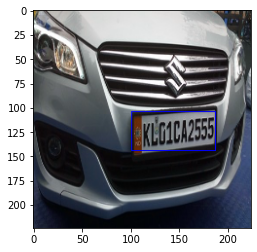

In [ ]:
#Example with the first image of the dataset
image = cv2.rectangle(X[0],(y[0][0],y[0][1]),(y[0][2],y[0][3]),(0, 0, 255))
plt.imshow(image)
plt.show()

In [ ]:
#Transforming in array
X=np.array(X)
y=np.array(y)

In [ ]:
#Renormalisation
X = X / 255
y = y / 255


In [ ]:
# splitting into train, validation and test set 
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=25)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=25)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.applications.vgg19 import VGG19

In [ ]:
# Training VGG-19 model on train data
model = Sequential()
model.add(VGG19(weights="imagenet", include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="sigmoid"))

model.layers[-6].trainable = False

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 128)               3211392   
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 4)                 260       
                                                                 
Total params: 23,260,804
Trainable params: 3,236,420
Non

In [ ]:
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

In [ ]:
train = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=32, verbose=1)

Epoch 1/20
9/9 [==============================] - 192s 22s/step - loss: 0.0987 - accuracy: 0.2971 - val_loss: 0.0727 - val_accuracy: 0.7571
Epoch 2/20
9/9 [==============================] - 191s 22s/step - loss: 0.0417 - accuracy: 0.5435 - val_loss: 0.0196 - val_accuracy: 0.7000
Epoch 3/20
9/9 [==============================] - 191s 22s/step - loss: 0.0150 - accuracy: 0.5833 - val_loss: 0.0129 - val_accuracy: 0.6429
Epoch 4/20
9/9 [==============================] - 190s 22s/step - loss: 0.0079 - accuracy: 0.6667 - val_loss: 0.0095 - val_accuracy: 0.7143
Epoch 5/20
9/9 [==============================] - 190s 22s/step - loss: 0.0045 - accuracy: 0.7862 - val_loss: 0.0084 - val_accuracy: 0.8714
Epoch 6/20
9/9 [==============================] - 191s 22s/step - loss: 0.0026 - accuracy: 0.9022 - val_loss: 0.0076 - val_accuracy: 0.8857
Epoch 7/20
9/9 [==============================] - 191s 22s/step - loss: 0.0017 - accuracy: 0.8949 - val_loss: 0.0074 - val_accuracy: 0.8714
Epoch 8/20
9/9 [====

In [ ]:
model.save('model.h5', overwrite=True) 

In [ ]:
# Test
scores = model.evaluate(X_test, y_test, verbose=0)
print("Score : %.2f%%" % (scores[1]*100)) 

Score : 85.06%


Accuracy of model on original test data: 85.0%

In [ ]:
def plot_scores(train) :
    accuracy = train.history['accuracy']
    val_accuracy = train.history['val_accuracy']
    epochs = range(len(accuracy))
    plt.plot(epochs, accuracy, 'b', label='Score train')
    plt.plot(epochs, val_accuracy, 'r', label='Score validation')
    plt.title('Scores')
    plt.legend()
    plt.show()

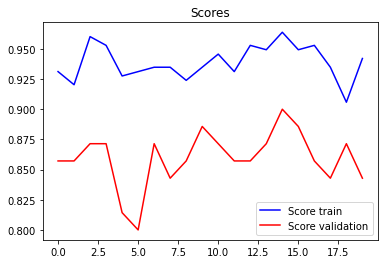

In [ ]:
plot_scores(train)

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test,steps=int(100))

print("Test results \n Loss:",test_loss,'\n Accuracy',test_accuracy)

100/100 [==============================] - 51s 506ms/step - loss: 0.0103 - accuracy: 0.8506
Test results 
 Loss: 0.010255234315991402 
 Accuracy 0.8505747318267822


In [ ]:
y_cnn = model.predict(X_test)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

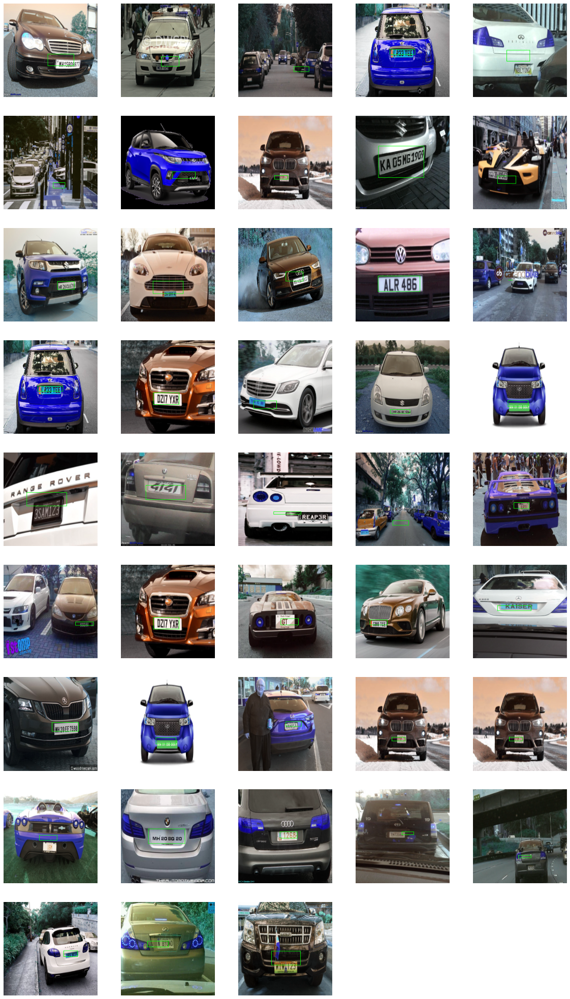

In [ ]:
plt.figure(figsize=(20,40))
for i in range(0,43) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    ny = y_cnn[i]*255
    image = cv2.rectangle(X_test[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0, 255, 0))
    plt.imshow(image)

# **Combined Data**
The following codes are using combined datasets to train the model

In [ ]:
img_dir = "/content/drive/MyDrive/combinedData/images" # Enter Directory of all images 
data_path = os.path.join(img_dir,'*g')
files = glob.glob(data_path)
files.sort() #We sort the images in alphabetical order to match them to the xml files containing the annotations of the bounding boxes
X=[]
for f1 in files: 
    img = cv2.imread(f1)
    img = cv2.resize(img, (IMAGE_SIZE,IMAGE_SIZE))
    X.append(np.array(img))
    

In [ ]:
from lxml import etree
def resizeannotation(f):
    tree = etree.parse(f)
    #for images whose license plates are cropped out
    xmin = 0
    ymin = 0
    xmax = 0
    ymax = 0
    for dim in tree.xpath("size"):
        width = int(dim.xpath("width")[0].text)
        height = int(dim.xpath("height")[0].text)
    for dim in tree.xpath("object/bndbox"):
        xmin = int(dim.xpath("xmin")[0].text)/(width/IMAGE_SIZE)
        ymin = int(dim.xpath("ymin")[0].text)/(height/IMAGE_SIZE)
        xmax = int(dim.xpath("xmax")[0].text)/(width/IMAGE_SIZE)
        ymax = int(dim.xpath("ymax")[0].text)/(height/IMAGE_SIZE)
    return [int(xmax), int(ymax), int(xmin), int(ymin)]
        

In [ ]:
path = '/content/drive/MyDrive/combinedData/annotations'
text_files = ['/content/drive/MyDrive/combinedData/annotations/'+f for f in sorted(os.listdir(path))]
y=[]
for i in text_files:
    y.append(resizeannotation(i))

In [ ]:
np.array(X).shape

(1142, 224, 224, 3)

In [ ]:
#checking if the sequence match 
import os
xml = sorted(os.listdir(path))
for i in range(len(xml)):
  imagePath= files[i].split("/")[6]
  if xml[i].split(".")[0] !=  imagePath.split(".")[0]:
    print("doesnt match")

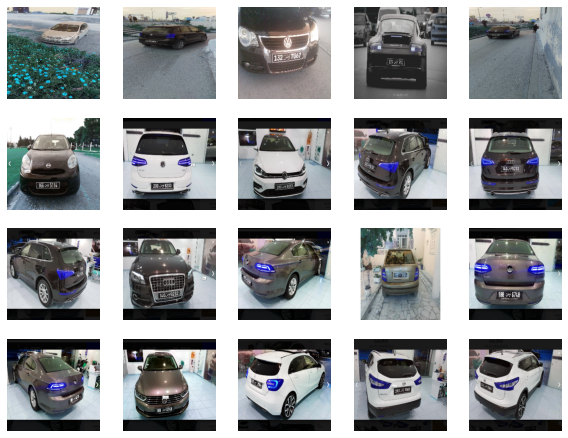

In [ ]:
#showing the image
plt.figure(figsize=(10,20))
for i in range(0,20) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    plt.imshow(X[i])

In [ ]:
#Transforming in array
X=np.array(X)
y=np.array(y)

In [ ]:
#Renormalisation
X = X / 255
y = y / 255

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=25)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=1)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.applications.vgg19 import VGG19

In [ ]:
# Create the model
model = Sequential()
model.add(VGG19(weights="imagenet", include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="sigmoid"))

model.layers[-6].trainable = False

model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_4 (Flatten)         (None, 25088)             0         
                                                                 
 dense_16 (Dense)            (None, 128)               3211392   
                                                                 
 dense_17 (Dense)            (None, 128)               16512     
                                                                 
 dense_18 (Dense)            (None, 64)                8256      
                                                                 
 dense_19 (Dense)            (None, 4)                 260       
                                                                 
Total params: 23,260,804
Trainable params: 3,236,420
N

In [ ]:
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

In [ ]:
train = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=32, verbose=1)

Epoch 1/20
23/23 [==============================] - 9s 366ms/step - loss: 0.0203 - accuracy: 0.6452 - val_loss: 0.0082 - val_accuracy: 0.8251
Epoch 2/20
23/23 [==============================] - 8s 350ms/step - loss: 0.0026 - accuracy: 0.8205 - val_loss: 0.0070 - val_accuracy: 0.8306
Epoch 3/20
23/23 [==============================] - 8s 350ms/step - loss: 0.0012 - accuracy: 0.8753 - val_loss: 0.0067 - val_accuracy: 0.8743
Epoch 4/20
23/23 [==============================] - 8s 351ms/step - loss: 8.1352e-04 - accuracy: 0.9192 - val_loss: 0.0067 - val_accuracy: 0.8689
Epoch 5/20
23/23 [==============================] - 8s 351ms/step - loss: 6.4426e-04 - accuracy: 0.9247 - val_loss: 0.0063 - val_accuracy: 0.8579
Epoch 6/20
23/23 [==============================] - 8s 351ms/step - loss: 4.2587e-04 - accuracy: 0.9479 - val_loss: 0.0065 - val_accuracy: 0.8361
Epoch 7/20
23/23 [==============================] - 8s 351ms/step - loss: 4.3352e-04 - accuracy: 0.9493 - val_loss: 0.0064 - val_accurac

In [ ]:
# Test
scores = model.evaluate(X_test, y_test, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

Score : 87.34%


In [ ]:
model.save('/drive/MyDrive/model2.h5', overwrite=True) 

In [ ]:
def plot_scores(train) :
    accuracy = train.history['accuracy']
    val_accuracy = train.history['val_accuracy']
    epochs = range(len(accuracy))
    plt.plot(epochs, accuracy, 'b', label='Score train')
    plt.plot(epochs, val_accuracy, 'r', label='Score validation')
    plt.title('Scores')
    plt.legend()
    plt.show()

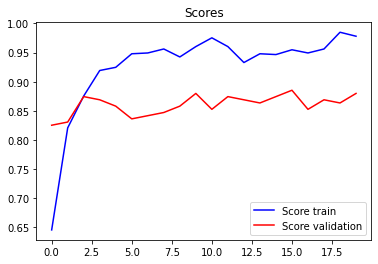

In [ ]:
plot_scores(train)

In [ ]:
def plot_scores_loss(train) :
    loss = train.history['loss']
    val_loss = train.history['val_loss']
    epochs = range(len(loss))
    plt.plot(epochs, loss, 'b', label='Loss train')
    plt.plot(epochs, val_loss, 'r', label='Loss validation')
    plt.title('Scores')
    plt.legend()
    plt.show()

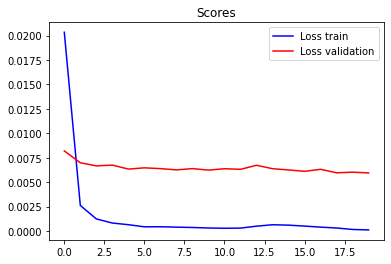

In [ ]:
plot_scores_loss(train)

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test,steps=int(100))

print("Test results \n Loss:",test_loss,'\n Accuracy',test_accuracy)

100/100 [==============================] - 149s 1s/step - loss: 0.0051 - accuracy: 0.8821
Test results 
 Loss: 0.00507980864495039 
 Accuracy 0.8820960521697998


In [ ]:
 y_cnn = model.predict(X_test)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

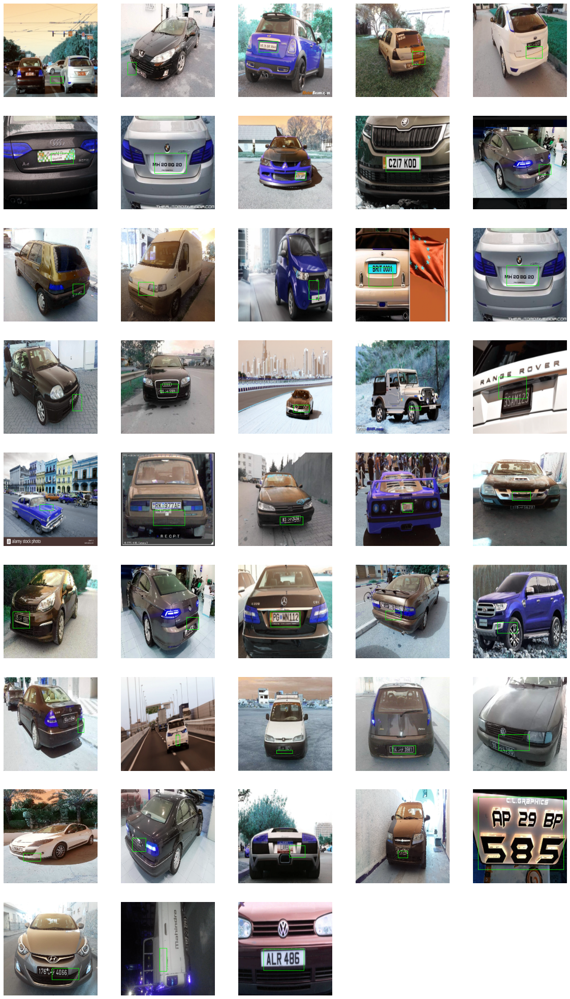

In [ ]:
plt.figure(figsize=(20,40))
for i in range(0,43) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    ny = y_cnn[i]*255
    image = cv2.rectangle(X_test[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0, 255, 0))
    plt.imshow(image)

**As such, since the accuracy of the model on test data is greater when tested on the combined dataset as compared to when tested on original dataset, we verify that combining different sources of data can increase the accuracy rate as it intentionally increasing noise of the data.**



# **Augmented Combined Data**
The following model uses the combined augmented data to train the model

In [ ]:
# images train
img_dir_train = "/content/drive/MyDrive/Data/images/train" # Enter Directory of all images 
data_path_train = os.path.join(img_dir_train,'*g')
files_train = glob.glob(data_path_train)
files_train.sort() #We sort the images in alphabetical order to match them to the xml files containing the annotations of the bounding boxes
X_train=[]
for f1 in files_train: 
    img = cv2.imread(f1)
    img = cv2.resize(img, (IMAGE_SIZE,IMAGE_SIZE))
    X_train.append(np.array(img))
    

In [ ]:
np.array(X_train).shape

(2190, 224, 224, 3)

In [ ]:
# images valid
img_dir_valid = "/content/drive/MyDrive/Data/images/validation" # Enter Directory of all images 
data_path_valid = os.path.join(img_dir_valid,'*g')
files_valid = glob.glob(data_path_valid)
files_valid.sort() #We sort the images in alphabetical order to match them to the xml files containing the annotations of the bounding boxes
X_valid=[]
for f1 in files_valid: 
    img = cv2.imread(f1)
    img = cv2.resize(img, (IMAGE_SIZE,IMAGE_SIZE))
    X_valid.append(np.array(img))

In [ ]:
np.array(X_valid).shape

(183, 224, 224, 3)

In [ ]:
# images test
img_dir_test = "/content/drive/MyDrive/Data/images/test" # Enter Directory of all images 
data_path_test = os.path.join(img_dir_test,'*g')
files_test = glob.glob(data_path_test)
files_test.sort() #We sort the images in alphabetical order to match them to the xml files containing the annotations of the bounding boxes
X_test=[]
for f1 in files_test: 
    img = cv2.imread(f1)
    img = cv2.resize(img, (IMAGE_SIZE,IMAGE_SIZE))
    X_test.append(np.array(img))

In [ ]:
np.array(X_test).shape

(229, 224, 224, 3)

In [ ]:
from lxml import etree
def resizeannotation(f):
    tree = etree.parse(f)
    #for images whose license plates are cropped out
    xmin = 0
    ymin = 0
    xmax = 0
    ymax = 0
    for dim in tree.xpath("size"):
        width = int(dim.xpath("width")[0].text)
        height = int(dim.xpath("height")[0].text)
    for dim in tree.xpath("object/bndbox"):
        xmin = int(dim.xpath("xmin")[0].text)/(width/IMAGE_SIZE)
        ymin = int(dim.xpath("ymin")[0].text)/(height/IMAGE_SIZE)
        xmax = int(dim.xpath("xmax")[0].text)/(width/IMAGE_SIZE)
        ymax = int(dim.xpath("ymax")[0].text)/(height/IMAGE_SIZE)
    return [int(xmax), int(ymax), int(xmin), int(ymin)]

In [ ]:
#annotations train
path_train = '/content/drive/MyDrive/Data/annotations/train'
text_files_train = ['/content/drive/MyDrive/Data/annotations/train/'+f for f in sorted(os.listdir(path_train))]
y_train=[]
for i in text_files_train:
    y_train.append(resizeannotation(i))

In [ ]:
np.array(y_train).shape

(2190, 4)

In [ ]:
#annotations valid
path_valid = '/content/drive/MyDrive/Data/annotations/valid'
text_files_valid = ['/content/drive/MyDrive/Data/annotations/valid/'+f for f in sorted(os.listdir(path_valid))]
y_valid=[]
for i in text_files_valid:
    y_valid.append(resizeannotation(i))

In [ ]:
np.array(y_valid).shape

(183, 4)

In [ ]:
#annotations test
path_test = '/content/drive/MyDrive/Data/annotations/test'
text_files_test = ['/content/drive/MyDrive/Data/annotations/test/'+f for f in sorted(os.listdir(path_test))]
y_test=[]
for i in text_files_test:
    y_test.append(resizeannotation(i))

In [ ]:
np.array(y_test).shape

(229, 4)

In [ ]:
#checking if the sequence match 
import os
for i in range(len(text_files_train)):
  imagePath = files_train[i].split("/")[7]
  xmlPath = text_files_train[i].split("/")[7]
  if xmlPath.split(".")[0] !=  imagePath.split(".")[0]:
    print("doesnt match")

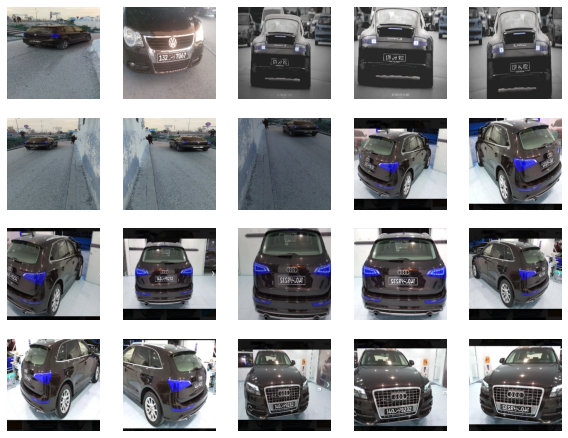

In [ ]:
#showing the image
plt.figure(figsize=(10,20))
for i in range(0,20) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    plt.imshow(X_train[i])

In [ ]:
#Transforming in array for train,valid,test
X_train=np.array(X_train)
y_train=np.array(y_train)

X_valid = np.array(X_valid)
y_valid = np.array(y_valid)

X_test=np.array(X_test)
y_test=np.array(y_test)

In [ ]:
#Renormalisation for train,valid,test
X_train = X_train / 255
y_train = y_train / 255

X_valid = X_valid/ 255
y_valid = y_valid / 255

X_test = X_test / 255
y_test = y_test / 255


In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Flatten,Dropout
from keras.applications.vgg19 import VGG19

In [ ]:
# Create the model
model = Sequential()
model.add(VGG19(weights="imagenet", include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="sigmoid"))

model.layers[-6].trainable = False

model.summary()

80150528/80134624 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 128)               3211392   
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 4)                 260       
                                                         

In [ ]:
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

In [ ]:
train = model.fit(X_train, y_train, validation_data=(X_valid, y_valid), epochs=35, batch_size=32, verbose=1)

Epoch 1/35
69/69 [==============================] - 51s 475ms/step - loss: 0.0596 - accuracy: 0.6452 - val_loss: 0.0422 - val_accuracy: 0.8087
Epoch 2/35
69/69 [==============================] - 21s 301ms/step - loss: 0.0358 - accuracy: 0.8142 - val_loss: 0.0086 - val_accuracy: 0.7486
Epoch 3/35
69/69 [==============================] - 21s 302ms/step - loss: 0.0070 - accuracy: 0.8160 - val_loss: 0.0079 - val_accuracy: 0.8743
Epoch 4/35
69/69 [==============================] - 21s 304ms/step - loss: 0.0035 - accuracy: 0.8712 - val_loss: 0.0058 - val_accuracy: 0.8798
Epoch 5/35
69/69 [==============================] - 21s 306ms/step - loss: 0.0018 - accuracy: 0.9201 - val_loss: 0.0058 - val_accuracy: 0.8852
Epoch 6/35
69/69 [==============================] - 21s 307ms/step - loss: 0.0013 - accuracy: 0.9265 - val_loss: 0.0056 - val_accuracy: 0.9071
Epoch 7/35
69/69 [==============================] - 21s 307ms/step - loss: 0.0010 - accuracy: 0.9297 - val_loss: 0.0056 - val_accuracy: 0.8743

In [ ]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

Score : 88.65%


In [ ]:
def plot_scores(train) :
    accuracy = train.history['accuracy']
    val_accuracy = train.history['val_accuracy']
    epochs = range(len(accuracy))
    plt.plot(epochs, accuracy, 'b', label='Score train')
    plt.plot(epochs, val_accuracy, 'r', label='Score validation')
    plt.title('Scores')
    plt.legend()
    plt.show()

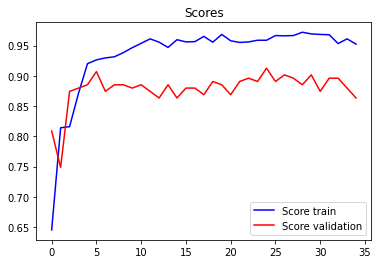

In [ ]:
plot_scores(train)

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test,steps=int(100))

print("Test results \n Loss:",test_loss,'\n Accuracy',test_accuracy)

100/100 [==============================] - 10s 86ms/step - loss: 0.0049 - accuracy: 0.8865
Test results 
 Loss: 0.004948907531797886 
 Accuracy 0.8864628672599792


In [ ]:
train = model.fit(X_train, y_train, validation_data=(X_valid, y_valid), epochs=20, batch_size=32, verbose=1)

Epoch 1/20
69/69 [==============================] - 22s 313ms/step - loss: 2.5592e-04 - accuracy: 0.9685 - val_loss: 0.0052 - val_accuracy: 0.9016
Epoch 2/20
69/69 [==============================] - 20s 297ms/step - loss: 3.2735e-04 - accuracy: 0.9662 - val_loss: 0.0051 - val_accuracy: 0.9016
Epoch 3/20
69/69 [==============================] - 20s 297ms/step - loss: 2.7109e-04 - accuracy: 0.9671 - val_loss: 0.0051 - val_accuracy: 0.8962
Epoch 4/20
69/69 [==============================] - 21s 299ms/step - loss: 3.0282e-04 - accuracy: 0.9648 - val_loss: 0.0051 - val_accuracy: 0.8962
Epoch 5/20
69/69 [==============================] - 21s 299ms/step - loss: 3.4564e-04 - accuracy: 0.9607 - val_loss: 0.0052 - val_accuracy: 0.8852
Epoch 6/20
69/69 [==============================] - 21s 299ms/step - loss: 4.1785e-04 - accuracy: 0.9607 - val_loss: 0.0051 - val_accuracy: 0.8852
Epoch 7/20
69/69 [==============================] - 21s 299ms/step - loss: 3.2868e-04 - accuracy: 0.9658 - val_loss: 0

In [ ]:
model.save('modelAugmentedCombine.h5', overwrite=True) 

In [ ]:
# Test
scores = model.evaluate(X_test, y_test, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

Score : 89.08%


In [ ]:
def plot_scores(train) :
    accuracy = train.history['accuracy']
    val_accuracy = train.history['val_accuracy']
    epochs = range(len(accuracy))
    plt.plot(epochs, accuracy, 'b', label='Score train')
    plt.plot(epochs, val_accuracy, 'r', label='Score validation')
    plt.title('Scores')
    plt.legend()
    plt.show()

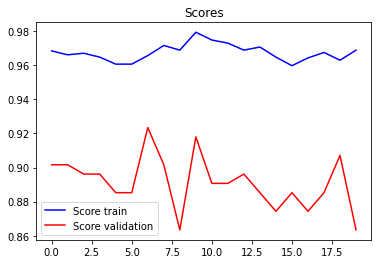

In [ ]:
plot_scores(train)

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test,steps=int(100))

print("Test results \n Loss:",test_loss,'\n Accuracy',test_accuracy)

100/100 [==============================] - 8s 76ms/step - loss: 0.0052 - accuracy: 0.8908
Test results 
 Loss: 0.005182348191738129 
 Accuracy 0.8908296823501587


In [ ]:
 y_cnn = model.predict(X_test)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

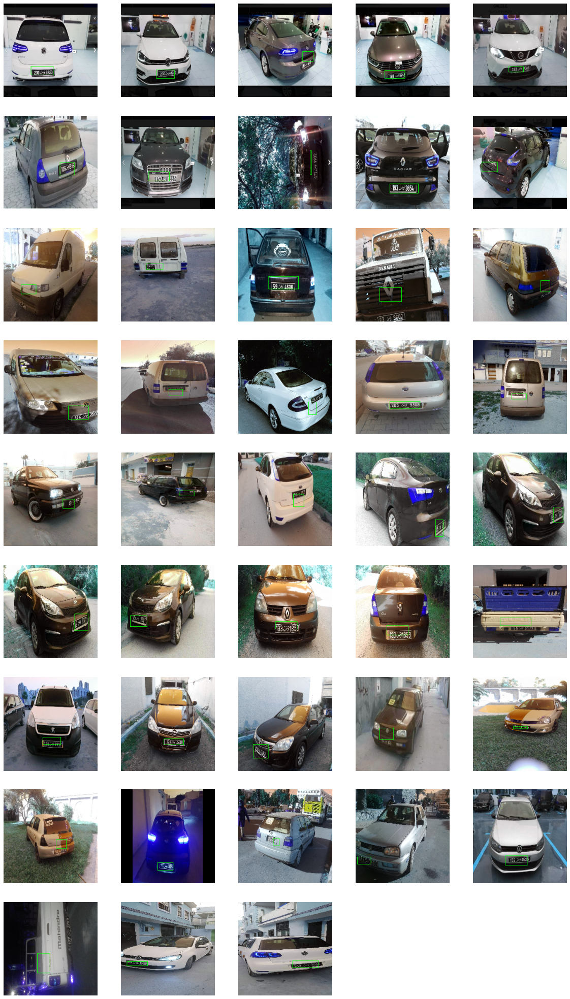

In [ ]:
plt.figure(figsize=(20,40))
for i in range(0,43) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    ny = y_cnn[i]*255
    image = cv2.rectangle(X_test[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0, 255, 0))
    plt.imshow(image)